In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import seaborn as sns


In [30]:
data = pd.read_csv('/Users/Tomi/Desktop/my_git/project/Proper/src:/utils:/AB_NYC_2019.csv')
data.head(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [31]:
data.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [32]:
data.shape

(48895, 16)

In [33]:
data.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [34]:
#Visualizacion de los nombres de las colimnas de nuestra Data

data.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

In [35]:
# Vamos a eliminar las columnas que no necesitamos para nuestro analisis.

data.drop(['id','host_name','last_review','number_of_reviews'], inplace = True , axis = 1)
data.head(5)

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,reviews_per_month,calculated_host_listings_count,availability_365
0,Clean & quiet apt home by the park,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,0.21,6,365
1,Skylit Midtown Castle,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,0.38,2,355
2,THE VILLAGE OF HARLEM....NEW YORK !,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,NaN,1,365
3,Cozy Entire Floor of Brownstone,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,4.64,1,194
4,Entire Apt: Spacious Studio/Loft by central park,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,0.10,1,0


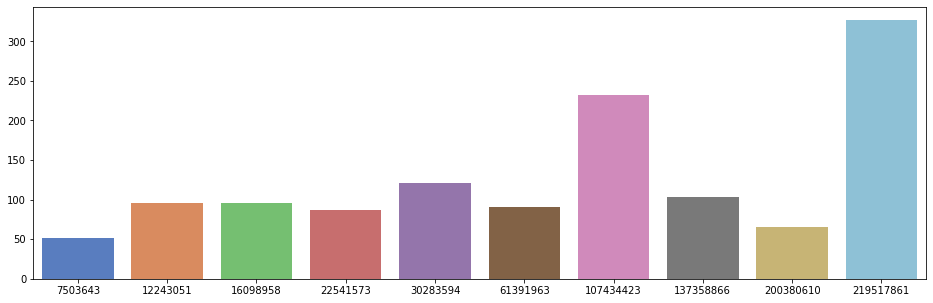

In [55]:
top = data.host_id.value_counts()[:10]
f,top1 = plt.subplots(figsize=(16,5))
top1 = sns.barplot(x = top.index,y=top.values,palette="muted")
plt.show()

In [ ]:
# Exploremo las localidades de New York

data.neighbourhood_group.unique()

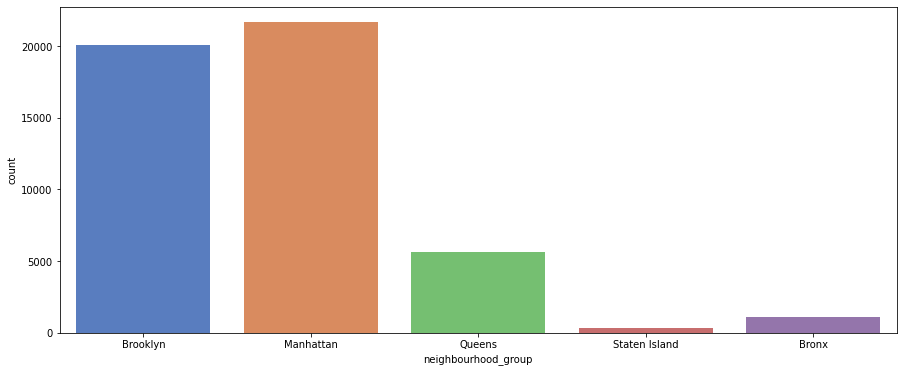

In [44]:
f,ax = plt.subplots(figsize=(15,6))
ax = sns.countplot(data.neighbourhood_group,palette="muted")
plt.show()

In [37]:
#Exploremos los nombres de los barrios en New York

data.neighbourhood.unique()

array(['Kensington', 'Midtown', 'Harlem', 'Clinton Hill', 'East Harlem',
       'Murray Hill', 'Bedford-Stuyvesant', "Hell's Kitchen",
       'Upper West Side', 'Chinatown', 'South Slope', 'West Village',
       'Williamsburg', 'Fort Greene', 'Chelsea', 'Crown Heights',
       'Park Slope', 'Windsor Terrace', 'Inwood', 'East Village',
       'Greenpoint', 'Bushwick', 'Flatbush', 'Lower East Side',
       'Prospect-Lefferts Gardens', 'Long Island City', 'Kips Bay',
       'SoHo', 'Upper East Side', 'Prospect Heights',
       'Washington Heights', 'Woodside', 'Brooklyn Heights',
       'Carroll Gardens', 'Gowanus', 'Flatlands', 'Cobble Hill',
       'Flushing', 'Boerum Hill', 'Sunnyside', 'DUMBO', 'St. George',
       'Highbridge', 'Financial District', 'Ridgewood',
       'Morningside Heights', 'Jamaica', 'Middle Village', 'NoHo',
       'Ditmars Steinway', 'Flatiron District', 'Roosevelt Island',
       'Greenwich Village', 'Little Italy', 'East Flatbush',
       'Tompkinsville', 'Asto

In [38]:
# Examinemos la cantidad de Barrios en New York

len(data.neighbourhood.unique())

221

In [39]:
# Types of room on Airbnb
data.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

In [40]:
# Know the quantity of rooms reserved by type
room = data.room_type.value_counts()
room.head()

Entire home/apt    25409
Private room       22326
Shared room         1160
Name: room_type, dtype: int64

In [41]:
room_df = pd.DataFrame(room)
room_df

,room_type
Entire home/apt,25409
Private room,22326
Shared room,1160


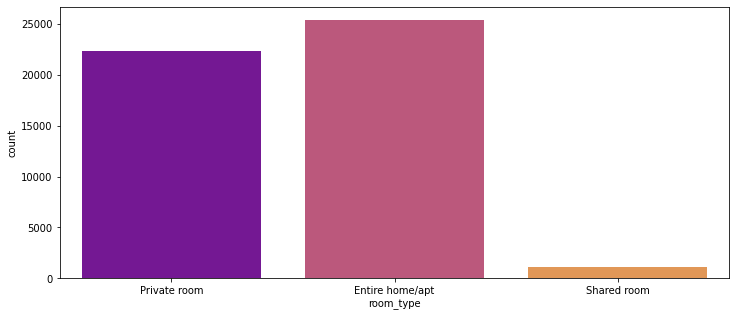

In [57]:
f,rt = plt.subplots(figsize=(12,5))
rt = sns.countplot(data.room_type,palette="plasma")
plt.show()

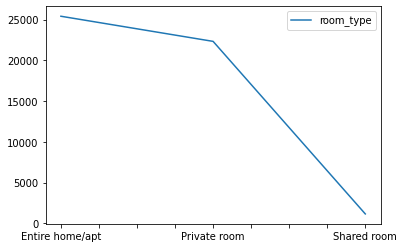

In [42]:
g1 = room_df.plot()
g1

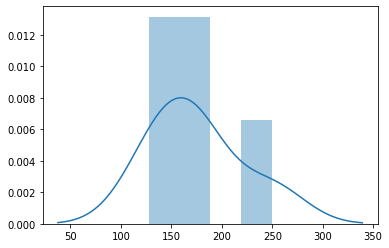

In [53]:
graf = data[data.room_type == "Entire home/apt"][["neighbourhood_group","price"]]
apt = graf.groupby("neighbourhood_group").mean()
sns.distplot(apt)
plt.show()

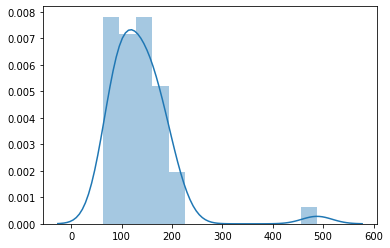

In [45]:
a

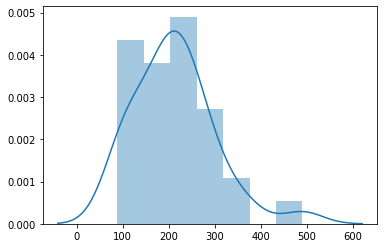

In [52]:
graf2 = data[data.neighbourhood_group == "Manhattan"][["neighbourhood","price"]]
manhattan = graf2.groupby("neighbourhood").mean()
sns.distplot(manhattan)
plt.show()

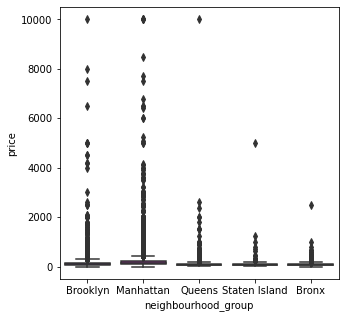

In [59]:
plt.figure(figsize=(5,5))
prinei = sns.boxplot(data=data, x='neighbourhood_group',y='price',palette='plasma')

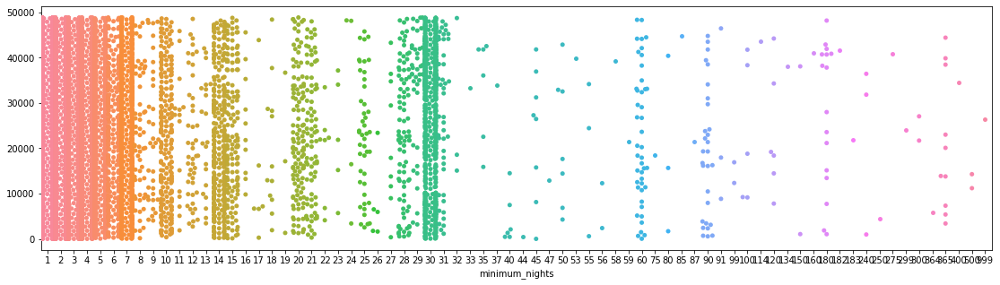

In [46]:
gf2 = data[data.room_type=="Private room"]['minimum_nights']
f,minnight = plt.subplots(figsize=(19,5))
minnight = sns.swarmplot(y= gf2.index,x= gf2.values)
plt.xlabel("minimum_nights")
plt.show()

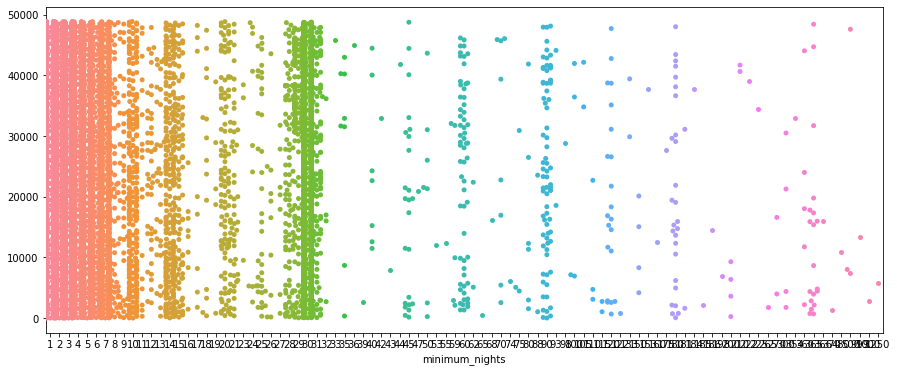

In [47]:
gf3 = data[data.room_type=="Entire home/apt"]['minimum_nights']
f,minnight1 = plt.subplots(figsize=(15,6))
minnight1 = sns.swarmplot(y= gf3.index,x= gf3.values)
plt.xlabel("minimum_nights")
plt.show()

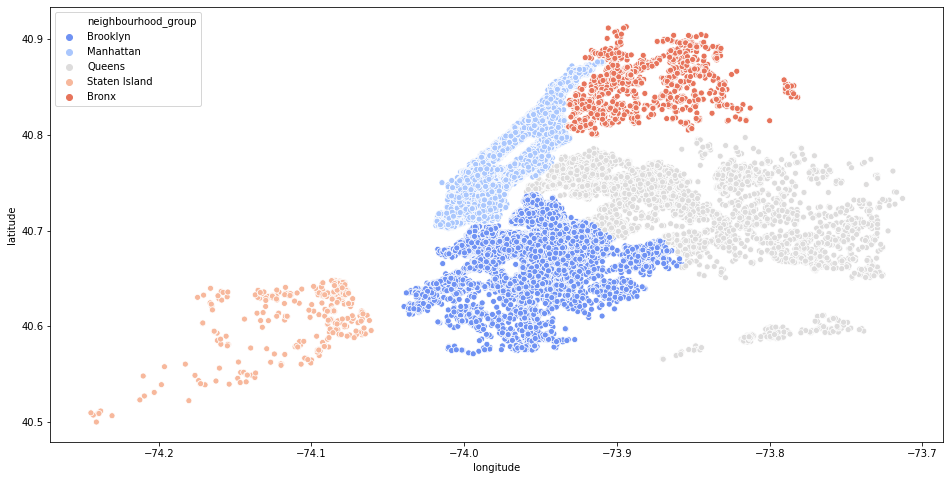

In [48]:
f,ll = plt.subplots(figsize=(16,8))
ll = sns.scatterplot(y=data.latitude,x=data.longitude,hue=data.neighbourhood_group,palette="coolwarm")
plt.show()